# chip reconstruction test task

In [1]:
import os
import sys
import numpy as np
from sklearn.linear_model import Lasso
# add path ../src to sys
sys.path.append(os.path.join(os.getcwd(), '../src'))

In [2]:
from blockfy import Blockfy
from basisgen import BasisGenerator
from lassoalphaoptimizer import LassoAlphaOptimizer

In [3]:
img_path = '../assets/nature/nature.bmp'
P,Q = 8,8
S = 30
M = 20 # num of training samples
train_test_ratio = 0.2
blockfy = Blockfy(img_path, (P,Q), P)
blockfy.generate_blocks()
corrpt_blocks = blockfy.generate_corrupted_blocks(S)
original_blocks = blockfy.get_blocks()
blocks_positioning = blockfy.get_blocks_positioning()

In [4]:
# get alphas for each block
lassoalphaoptimizer = LassoAlphaOptimizer(S,M,train_test_ratio,P,Q)
alphas = lassoalphaoptimizer.optimize_alphas(img_path)

Optimizing alphas:  45%|████▌     | 2328/5120 [12:48<21:52,  2.13blocks/s]/Users/wanghley/Library/jupyterlab-desktop/jlab_server/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.985e-02, tolerance: 2.430e-02
  model = cd_fast.enet_coordinate_descent(
Optimizing alphas:  47%|████▋     | 2400/5120 [13:24<22:26,  2.02blocks/s]/Users/wanghley/Library/jupyterlab-desktop/jlab_server/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/wanghley/Library/jupyterlab-desktop/jlab_server/lib/python3

In [5]:
basisgen = BasisGenerator(P,Q)
basis_matrix = basisgen.generate_basis_matrix()

In [6]:
corrpt_blocks.shape

(5120, 8, 8)

In [7]:
recovered_blocks = []

for i in range(min(len(corrpt_blocks), len(alphas))):
    block = corrpt_blocks[i] 
    alpha = alphas[i]
    
    blk_flat = block.flatten()
    good_idx = np.where(~np.isnan(blk_flat))[0].astype(int)
    corrpt_idx = np.isnan(blk_flat)
    X = basis_matrix[good_idx,:]
    y = blk_flat[good_idx]
    
    lasso = Lasso(alpha=alphas[i], fit_intercept=False, max_iter=10000)
    lasso.fit(X,y)
    
    recov_chip = np.zeros((P, Q))
    
    full_block = corrpt_blocks[i].copy()
    block_flat = full_block.flatten()
    nan_indices = np.where(np.isnan(block_flat))[0]
    X_missing = basis_matrix[nan_indices]
    y_missing = lasso.predict(X_missing)
    block_flat[nan_indices] = y_missing
    recov_chip = block_flat.reshape(P, Q)
    
    recovered_blocks.append(recov_chip)

/Users/wanghley/Library/jupyterlab-desktop/jlab_server/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/wanghley/Library/jupyterlab-desktop/jlab_server/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/wanghley/Library/jupyterlab-desktop/jlab_server/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the nu

In [8]:
# make it 2D array
original_blocks = np.array(original_blocks)
original_blocks.shape

(5120, 8, 8)

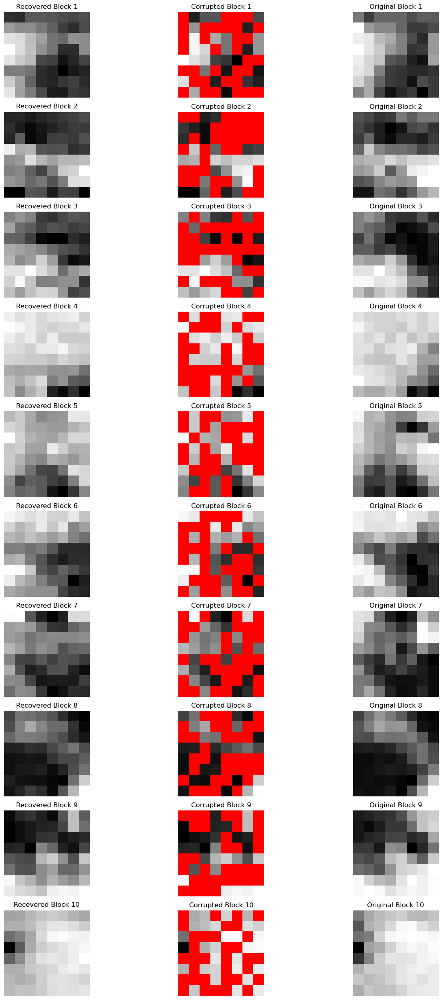

In [ ]:
import numpy as np

# plot the first 10 recovered blocks, corrupted blocks and original blocks
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 25))
num_blocks = 10

# Create a custom colormap for NaN values (red) and regular values (grayscale)
import matplotlib.colors as mcolors

# Create a copy of corrupted blocks for visualization 
corrupted_blocks_viz = np.copy(corrpt_blocks[:num_blocks])

# Set up grayscale colormap with red for NaN values
cmap = plt.cm.gray
cmap.set_bad(color='red')

# Make sure plots use this colormap
plt.rcParams['image.cmap'] = 'gray'

for i in range(num_blocks):
    plt.subplot(num_blocks, 3, i*3+1)
    plt.imshow(recovered_blocks[i], cmap='gray')
    plt.title(f'Recovered Block {i+1}')
    plt.axis('off')
    
    plt.subplot(num_blocks, 3, i*3+2)
    plt.imshow(corrpt_blocks[i], cmap=cmap)
    plt.title(f'Corrupted Block {i+1}')
    plt.axis('off')
    
    plt.subplot(num_blocks, 3, i*3+3)
    plt.imshow(original_blocks[i], cmap='gray')
    plt.title(f'Original Block {i+1}')
    plt.axis('off')

plt.tight_layout()
plt.show()

### Whole image reconstruction

(np.float64(-0.5), np.float64(639.5), np.float64(511.5), np.float64(-0.5))

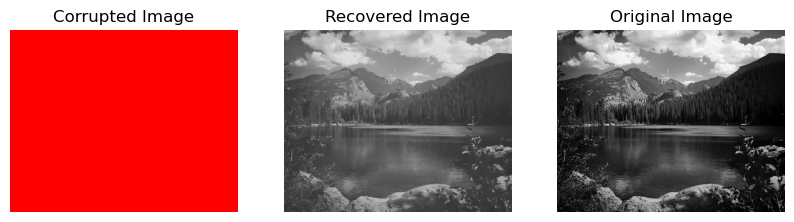

In [10]:
# Convert recovered_blocks list to a numpy array
recovered_blocks_array = np.array(recovered_blocks)

original = blockfy.block_to_image(original_blocks)

corrupted = blockfy.block_to_image(corrpt_blocks)

# merge back the 8x8 recovered blocks to the original image
recovered_img = blockfy.block_to_image(recovered_blocks_array)

plt.figure(figsize=(10, 10))
plt.subplot(1, 3, 1)
plt.imshow(corrupted, cmap=cmap)
plt.title('Corrupted Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(recovered_img, cmap='gray')
plt.title('Recovered Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(original, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Full image reconstruction from corrupted image

In [1]:
import pandas as pd
import os
import sys
import numpy as np
from sklearn.linear_model import Lasso
# add path ../src to sys
sys.path.append(os.path.join(os.getcwd(), '../src'))

from blockfy import Blockfy
from basisgen import BasisGenerator
from lassoalphaoptimizer import LassoAlphaOptimizer

In [2]:
df = pd.read_csv('../assets/field_test/field_test_image.txt', header=None, delimiter=',')
df.head()

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
0,NaN,88.0,NaN,139.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,149.0,NaN,NaN,NaN,NaN,139.0,NaN,141.0,NaN
1,NaN,49.0,NaN,NaN,132.0,141.0,NaN,NaN,NaN,64.0,...,NaN,141.0,135.0,135.0,NaN,134.0,NaN,NaN,NaN,NaN
2,48.0,NaN,NaN,67.0,NaN,NaN,NaN,148.0,132.0,94.0,...,NaN,NaN,NaN,NaN,146.0,143.0,149.0,NaN,146.0,149.0
3,NaN,NaN,38.0,NaN,NaN,86.0,NaN,100.0,NaN,NaN,...,NaN,NaN,148.0,NaN,NaN,NaN,145.0,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,42.0,NaN,79.0,NaN,NaN,...,NaN,146.0,NaN,NaN,NaN,NaN,148.0,NaN,NaN,139.0


In [13]:
crrpt_image = df.to_numpy()

In [4]:
P,Q = 8,8
S = 30
M = 20 # num of training samples
train_test_ratio = 0.2

In [5]:
blckfy = Blockfy(crrpt_image, (P,Q), P)
blcks = blckfy.generate_blocks()

In [6]:
S = P*Q - np.isnan(blcks[0,0]).sum()

In [7]:
# get alphas for each block
lassoalphaoptimizer = LassoAlphaOptimizer(S,M,train_test_ratio,P,Q)
alphas = lassoalphaoptimizer.optimize_alphas(crrpt_image, is_corrupted=True)

Optimizing alphas:   0%|          | 0/1536 [00:00<?, ?blocks/s]

Optimizing alphas: 100%|██████████| 1536/1536 [21:57<00:00,  1.17blocks/s] 


In [9]:
basisgen = BasisGenerator(P,Q)
basis_matrix = basisgen.generate_basis_matrix()

In [17]:
blcks.shape

(1536, 8, 8)

In [16]:
# reshape from (32, 48, 8, 8) to (1536, 8, 8)
blcks = blcks.reshape(-1, P, Q)

In [18]:
recovered_blocks = []

for i in range(min(len(blcks), len(alphas))):
    block = blcks[i] 
    alpha = alphas[i]
    
    blk_flat = block.flatten()
    good_idx = np.where(~np.isnan(blk_flat))[0].astype(int)
    corrpt_idx = np.isnan(blk_flat)
    X = basis_matrix[good_idx,:]
    y = blk_flat[good_idx]
    
    lasso = Lasso(alpha=alphas[i], fit_intercept=False, max_iter=10000)
    lasso.fit(X,y)
    
    recov_chip = np.zeros((P, Q))
    
    full_block = blcks[i].copy()
    block_flat = full_block.flatten()
    nan_indices = np.where(np.isnan(block_flat))[0]
    X_missing = basis_matrix[nan_indices]
    y_missing = lasso.predict(X_missing)
    block_flat[nan_indices] = y_missing
    recov_chip = block_flat.reshape(P, Q)
    
    recovered_blocks.append(recov_chip)

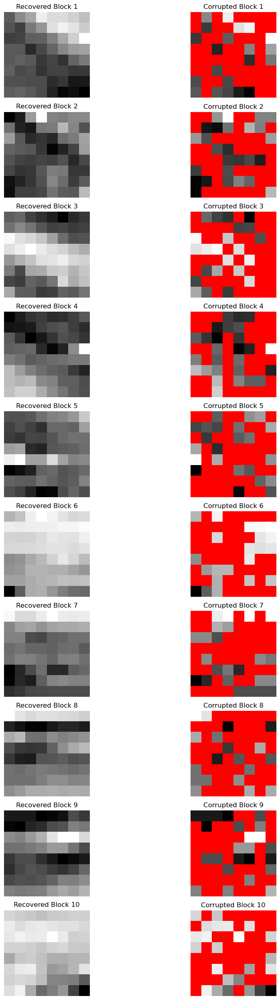

In [19]:
import numpy as np

# plot the first 10 recovered blocks, corrupted blocks and original blocks
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 25))
num_blocks = 10

# Create a custom colormap for NaN values (red) and regular values (grayscale)
import matplotlib.colors as mcolors

# Create a copy of corrupted blocks for visualization 
corrupted_blocks_viz = np.copy(blcks[:num_blocks])

# Set up grayscale colormap with red for NaN values
cmap = plt.cm.gray
cmap.set_bad(color='red')

# Make sure plots use this colormap
plt.rcParams['image.cmap'] = 'gray'

for i in range(num_blocks):
    plt.subplot(num_blocks, 3, i*3+1)
    plt.imshow(recovered_blocks[i], cmap='gray')
    plt.title(f'Recovered Block {i+1}')
    plt.axis('off')
    
    plt.subplot(num_blocks, 3, i*3+2)
    plt.imshow(blcks[i], cmap=cmap)
    plt.title(f'Corrupted Block {i+1}')
    plt.axis('off')

plt.tight_layout()
plt.show()

(np.float64(-0.5), np.float64(383.5), np.float64(255.5), np.float64(-0.5))

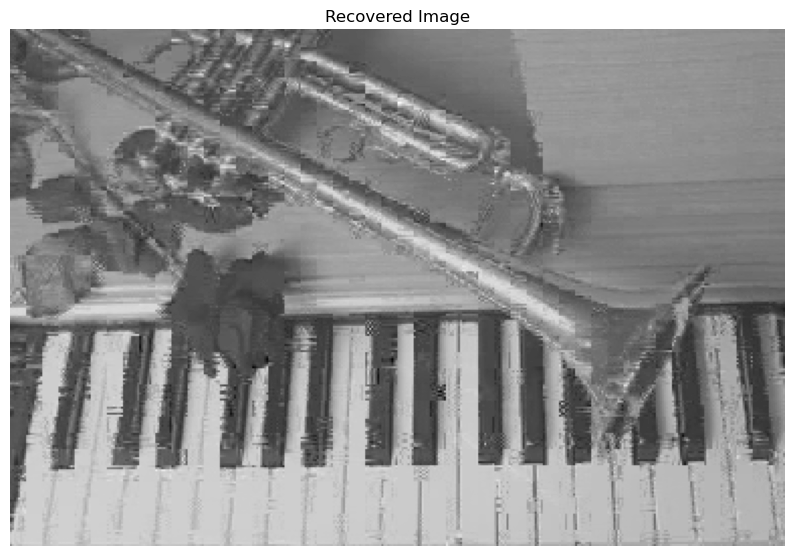

In [23]:
# Convert recovered_blocks list to a numpy array
recovered_blocks_array = np.array(recovered_blocks)


corrupted = blckfy.block_to_image(blcks)

# merge back the 8x8 recovered blocks to the original image
recovered_img = blckfy.block_to_image(recovered_blocks_array)

plt.figure(figsize=(10, 10))

plt.imshow(recovered_img, cmap='gray')
plt.title('Recovered Image')
plt.axis('off')